<a href="https://colab.research.google.com/github/RSPatQ6IBI/signal_processing_labs.github.io/blob/main/tutorials_/removing_tones_notch_dfn_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#@title 💚🏕️🌿🌲🌳☘️ GETTING THE PACKAGES, AND AUDIO FROM URL

import numpy as np
from scipy.io.wavfile import write as write_wav
from IPython.display import Audio, display
import os

!gdown 11D-Ks1V2jKUAk6ksUmRhmshrMo0_gn0o -O sample.wav


Downloading...
From: https://drive.google.com/uc?id=11D-Ks1V2jKUAk6ksUmRhmshrMo0_gn0o
To: /content/sample.wav
100% 2.71M/2.71M [00:00<00:00, 95.5MB/s]


# Load and display the audio file
 - ⏭⏭ using `IPython.display.Audio`.

In [3]:
from scipy.io import wavfile

# Load and display the audio file
audio_path_ = 'sample.wav'
# Load the audio file (using the path defined earlier)
samplerate, data = wavfile.read(audio_path_)
display(Audio(audio_path_))

/tmp/ipython-input-3-537219441.py:6: WavFileWarning: Chunk (non-data) not understood, skipping it.
  samplerate, data = wavfile.read(audio_path_)


### Generating Spectrogram from Audio

To generate a spectrogram, we'll read the audio file, compute the Short-Time Fourier Transform (STFT), and then visualize the frequency content over time.

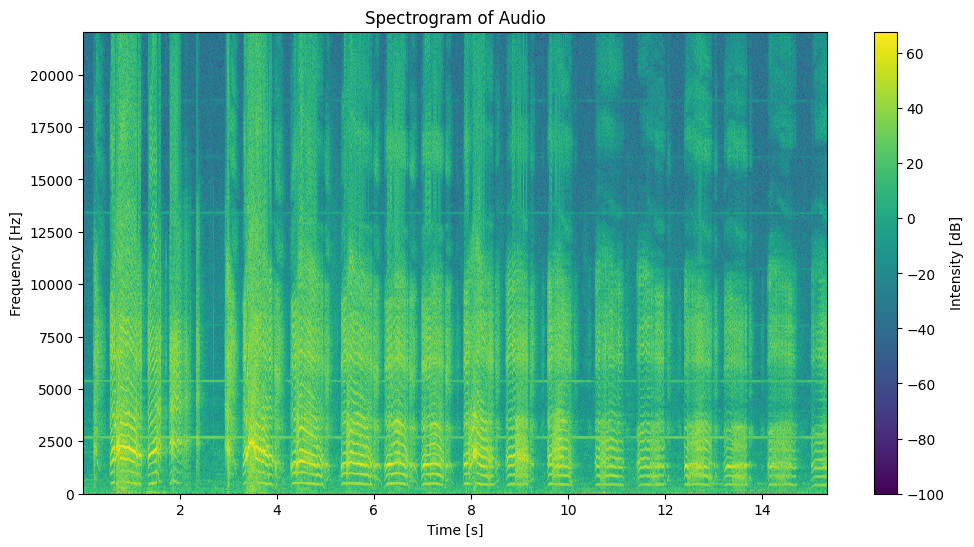

In [4]:
#@title ▶︎ •၊၊||၊|။||||။၊|Ã 0:10   PLOTTING THE SPECTROGRAM
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.signal import spectrogram

data = data[:, 0]

f, t, Sxx = spectrogram(data, fs=samplerate, window='hann', nperseg=1024, noverlap=512)

# Spectrogram plotting
plt.figure(figsize=(12, 6))
plt.pcolormesh(t, f, 10 * np.log10(Sxx)) # Convert to dB
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.title('Spectrogram of Audio')
plt.colorbar(label='Intensity [dB]')
plt.ylim([0, samplerate / 2]) # Limit y-axis to Nyquist frequency
plt.show()

# 🗺 TONES AS NOISE
We can notice there are tones in the spectrogram which are causing noisy patterns in the signal

Lets try removing it using
 + a) Notch filter
 + b) Deepfilternet


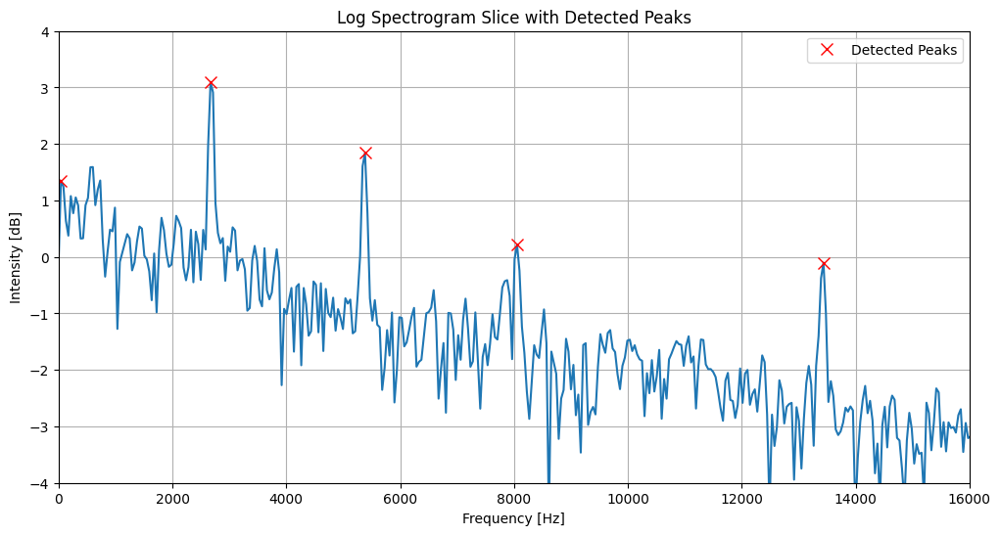

Detected 5 peaks at frequencies (Hz):
[   43.06640625  2670.1171875   5383.30078125  8053.41796875
 13436.71875   ]


In [6]:
#@title  📻 IDENTIFYING TONE FREQUENCIES IN SPECTRUM

from scipy.signal import find_peaks

hf_ = int(samplerate/2)
idx_= 45
a_spec_ = Sxx[:,idx_]
# ___________________________ #
a_spec_log_ = np.log10(Sxx[:,idx_])
f_axis_ = np.linspace(0, hf_, len(a_spec_))
# ___________________________ #


peaks, properties = find_peaks(a_spec_log_, height=-1.0, distance=50)

# Map peak indices to frequencies
peak_frequencies = f_axis_[peaks]

plt.figure(figsize=(12, 6))
plt.plot(f_axis_, a_spec_log_)
plt.plot(peak_frequencies, a_spec_log_[peaks], "x", color='red', markersize=8, label='Detected Peaks')
plt.xlim(0, 16000)
plt.ylim(-4, 4)
plt.grid()
plt.title('Log Spectrogram Slice with Detected Peaks')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Intensity [dB]')
plt.legend()
plt.show()

print(f"Detected {len(peaks)} peaks at frequencies (Hz):\n{peak_frequencies}")

# 🐩 FILTERING TONES

The tones are detected at 2670, 5383 and 8053 Hz frequencies , lets remove these one by one using notch filtering.  

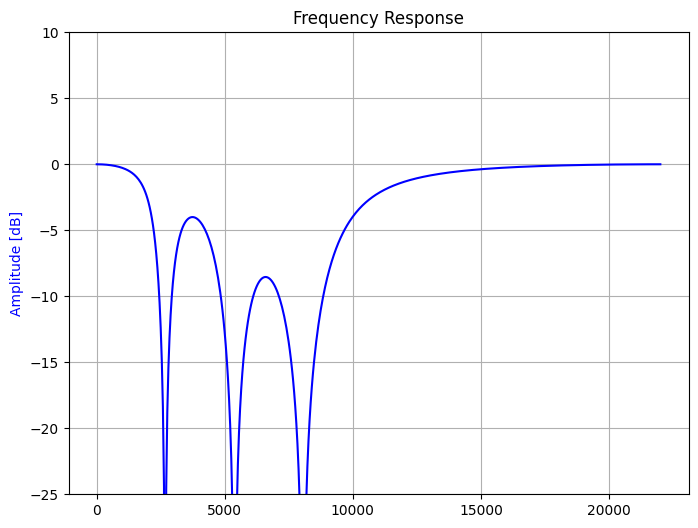

In [13]:
import scipy.signal as signal

w1_ = peak_frequencies[1]
w2_ = peak_frequencies[2]
w3_ = peak_frequencies[3]

Q_ = 2.0
b1_, a1_ = signal.iirnotch(w1_, Q_, samplerate)
b2_, a2_ = signal.iirnotch(w2_, Q_, samplerate)
b3_, a3_ = signal.iirnotch(w3_, Q_, samplerate)

a_res_ = np.convolve(a1_, a2_)
a_res_ = np.convolve(a_res_, a3_)
b_res_ = np.convolve(b1_, b2_)
b_res_ = np.convolve(b_res_, b3_)
# Frequency response
freq, h = signal.freqz(b_res_, a_res_, fs=samplerate)
# Plot
plt.figure(figsize=(8, 6))
plt.plot(freq, 20*np.log10(abs(h)), color='blue')
plt.title("Frequency Response")
plt.ylabel("Amplitude [dB]", color='blue')
plt.ylim([-25, 10])
plt.grid(True)
plt.show()



In [14]:
#@title APPYING NOTCH FILTER AND VISUALIZING FILTERED AUDIO

from scipy.signal import lfilter

# Apply the notch filter to the audio data
filtered_data_1_ = lfilter(b1_, a1_, data)
filtered_data_1_ = lfilter(b1_, a1_, filtered_data_1_)
filtered_data_2_ = lfilter(b2_, a2_, filtered_data_1_)
filtered_data_2_ = lfilter(b2_, a2_, filtered_data_2_)
filtered_data_3_ = lfilter(b3_, a3_, filtered_data_2_)
filtered_data_3_ = lfilter(b3_, a3_, filtered_data_3_)
filtered_data = lfilter(b_res_, a_res_, data)

# Display the filtered audio
print("Original Audio:")
display(Audio(data=data, rate=samplerate))
print("Filtered Audio (notch at 2670 Hz):")
display(Audio(data=filtered_data_1_, rate=samplerate))
print("Filtered Audio (notch at 2670 and 5383 Hz):")
display(Audio(data=filtered_data_2_, rate=samplerate))
print("Filtered Audio (notch at 8053 Hz):")
display(Audio(data=filtered_data_3_, rate=samplerate))
print("Filtered Audio (composite notch):")
display(Audio(data=filtered_data, rate=samplerate))

Original Audio:


Filtered Audio (notch at 2670 Hz):


Filtered Audio (notch at 2670 and 5383 Hz):


Filtered Audio (notch at 8053 Hz):


Filtered Audio (composite notch):


Now, let's visualize the spectrogram of the filtered audio to see the effect of the notch filter.

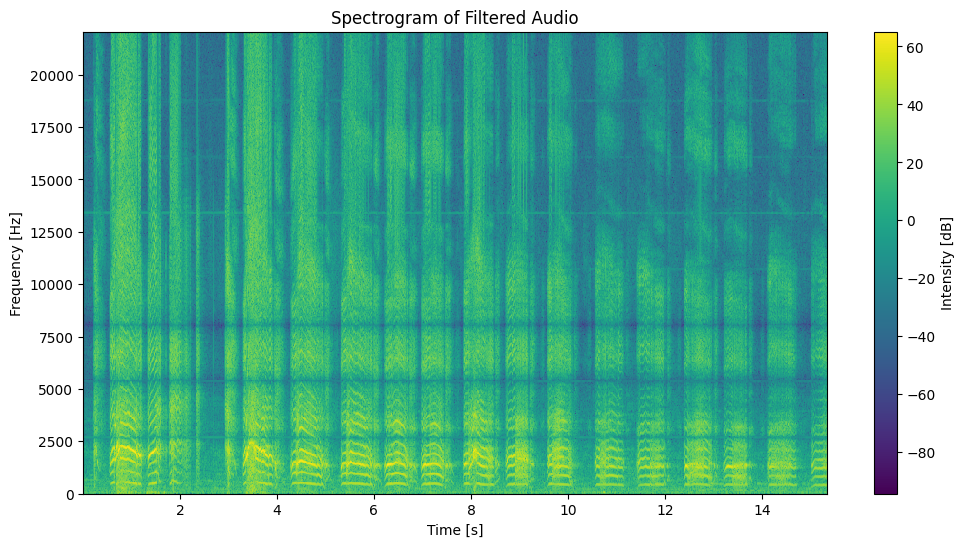

In [15]:
#@title Compute the spectrogram of the filtered data
f_filtered, t_filtered, Sxx_filtered = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=1024, noverlap=512)

# Plot the spectrogram of the filtered audio
plt.figure(figsize=(12, 6))
plt.pcolormesh(t_filtered, f_filtered, 10 * np.log10(Sxx_filtered))
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.title('Spectrogram of Filtered Audio')
plt.colorbar(label='Intensity [dB]')
plt.ylim([0, samplerate / 2]) # Limit y-axis to Nyquist frequency
plt.show()

# 🚧
# REQUIRED CONFIGURATION OF RUNTIME FOR DEEPFILTERNET TO WORK

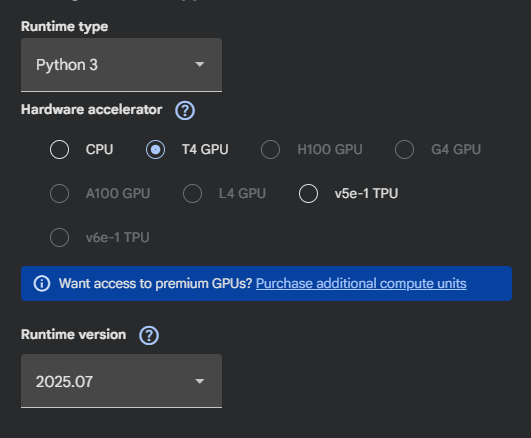

In [16]:
#@title INSTALL DESIRED STABLE PYTORCH
!pip install torch torchaudio -f https://download.pytorch.org/whl/cpu/torch_stable.html


Looking in links: https://download.pytorch.org/whl/cpu/torch_stable.html
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 127.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 29.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 79.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvi

In [17]:
#@title CLONE DFN CODE
!git clone https://github.com/Rikorose/DeepFilterNet.git

Cloning into 'DeepFilterNet'...
remote: Enumerating objects: 11251, done.
remote: Counting objects: 100% (2389/2389), done.
remote: Compressing objects: 100% (124/124), done.
remote: Total 11251 (delta 2303), reused 2265 (delta 2265), pack-reused 8862 (from 1)
Receiving objects: 100% (11251/11251), 175.02 MiB | 31.14 MiB/s, done.
Resolving deltas: 100% (7994/7994), done.


In [18]:
#@title DEEPFILTERNET
!pip install deepfilternet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.2/113.2 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.8/568.8 kB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 104.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 7.5 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
db-dtypes 1.4.3 requires packaging>=24

In [1]:
#@title DFN : MODEL INITIALIZATION
from df.enhance import enhance, init_df, load_audio, save_audio
from df.utils import download_file

model, df_state, _ = init_df()
#     # Download and open some audio file. You use your audio files here
# audio_path = "/content/drive/MyDrive/Audio_Processing_Notebooks_/Cry-Beep-ZOOM0052_TrLR-2.wav"
# audio, _ = load_audio(audio_path, sr=df_state.sr())
#     # Denoise the audio
# enhanced = enhance(model, df_state, audio)
#     # Save for listening
# save_audio("enhanced.wav", enhanced, df_state.sr())

/usr/local/lib/python3.11/dist-packages/df/io.py:9: UserWarning: `torchaudio.backend.common.AudioMetaData` has been moved to `torchaudio.AudioMetaData`. Please update the import path.
  from torchaudio.backend.common import AudioMetaData


2026-05-13 03:40:06 | INFO     | DF | Running on torch 2.6.0+cu124
2026-05-13 03:40:06 | INFO     | DF | Running on host 9735b6718dbf
2026-05-13 03:40:06 | INFO     | DF | Loading model settings of DeepFilterNet3
2026-05-13 03:40:06 | INFO     | DF | Using DeepFilterNet3 model at /root/.cache/DeepFilterNet/DeepFilterNet3
2026-05-13 03:40:06 | INFO     | DF | Initializing model `deepfilternet3`
2026-05-13 03:40:06 | INFO     | DF | Found checkpoint /root/.cache/DeepFilterNet/DeepFilterNet3/checkpoints/model_120.ckpt.best with epoch 120
2026-05-13 03:40:06 | INFO     | DF | Running on device cuda:0
2026-05-13 03:40:06 | INFO     | DF | Model loaded


In [4]:
#@title DFN : LOAD AUDIO
audio_path = "sample.wav"
audio, _ = load_audio(audio_path, sr=df_state.sr())


In [7]:
#@title DFN : ENHANCE AUDIO , DISPLAY
from IPython.display import Audio, display

enhanced = enhance(model, df_state, audio)
print(enhanced.numpy())

filtered_data_dfn_= enhanced.numpy().T
filtered_data_dfn_ = filtered_data_dfn_[:,1]

display(Audio(data=filtered_data_dfn_, rate=samplerate))

[[-7.2524708e-04  1.9804247e-04  4.5458950e-05 ... -3.4031912e-04
  -8.9971157e-04 -2.5886248e-04]
 [-1.5727110e-03 -3.2495911e-05  7.8304976e-05 ... -3.4353443e-04
  -7.3009398e-04 -2.2315138e-04]]


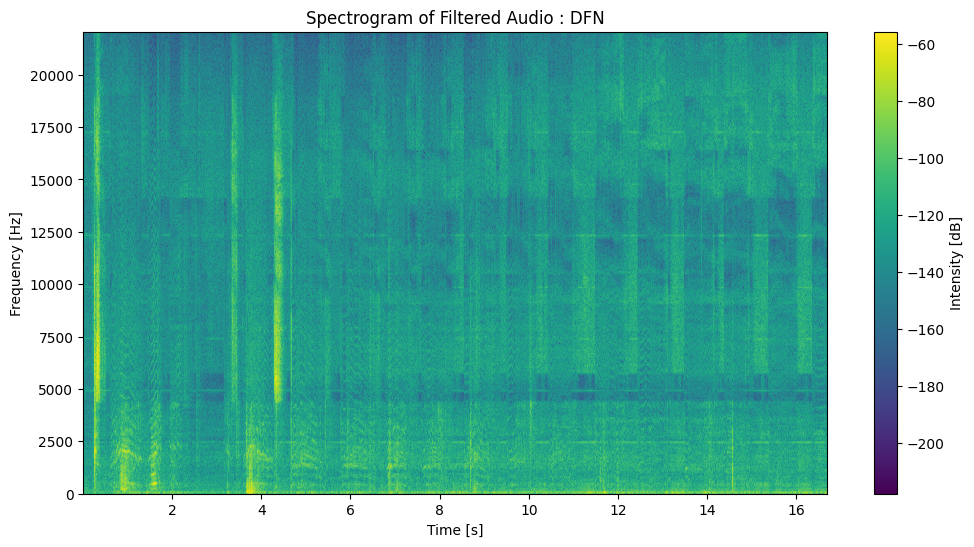

In [11]:
from scipy.signal import spectrogram
import numpy as np
#@title Compute the spectrogram of the filtered data
f_filtered, t_filtered, Sxx_filtered = spectrogram(filtered_data_dfn_, fs=samplerate, window='hann', nperseg=1024, noverlap=512)

# Plot the spectrogram of the filtered audio
plt.figure(figsize=(12, 6))
plt.pcolormesh(t_filtered, f_filtered, 10 * np.log10(Sxx_filtered))
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [s]')
plt.title('Spectrogram of Filtered Audio : DFN')
plt.colorbar(label='Intensity [dB]')
plt.ylim([0, samplerate / 2]) # Limit y-axis to Nyquist frequency
plt.show()